In [1]:
import numpy as np
import yaml
import shutil
import uuid
from tensorflow.keras import backend as K
from nn_tools import read_count
import tensorflow as tf
from data_bank import data_selector
import model_builders as mb
import os
from os.path import join
import matplotlib.pyplot as plt
import sys
from adversarial_attacks.spsa import spsa, spsa_T1
from adversarial_attacks.df_attacks import attack_network
from tensorflow.keras.applications.resnet50 import preprocess_input as res_prep
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_prep
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.metrics import SparseCategoricalAccuracy

In [2]:
from Demo_evaluate_network import print_certainty_vs_distance_table
import math
from scipy.special import softmax

In [3]:
def inv_logit(x):
    
    y = np.zeros(2)
    
    y = softmax(x)
    
    return y


In [4]:
#Setup model

tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
configfile = 'config_conf_mat.yml'

with open(configfile) as ymlfile:
    cgf = yaml.load(ymlfile, Loader =yaml.SafeLoader)

# Set up computational resource 
os.environ["CUDA_VISIBLE_DEVICES"]= "2"

# Turn on soft memory allocation
tf_config = tf.compat.v1.ConfigProto()
tf_config.gpu_options.allow_growth = True
tf_config.log_device_placement = False
sess = tf.compat.v1.Session(config=tf_config)
#K.v1.set_session(sess)

In [5]:
%%time
data_loader = data_selector(cgf['DATASET']['name'], cgf['DATASET']['arguments'])

data, labels, diff = data_loader.load_data() 

CPU times: user 32 ms, sys: 12.5 s, total: 12.5 s
Wall time: 1min 35s


In [6]:
data = data[:3000,:,:]
labels = labels[:3000]

'''
data = np.load(cgf["DATASET"]["arguments"]["images"])
labels = np.load(cgf["DATASET"]["arguments"]["labels"])
'''

'\ndata = np.load(cgf["DATASET"]["arguments"]["images"])\nlabels = np.load(cgf["DATASET"]["arguments"]["labels"])\n'

In [7]:
# Get input and output shape
input_shape = data.shape[1:]
#output_shape = labels.shape[1];
print('input_shape', input_shape)
# Set the default precision 
model_precision = cgf['MODEL_METADATA']['precision']
K.set_floatx(model_precision)

model_id = cgf['MODEL_METADATA']['model_number_arguments']['model_id']
model_path = join('model', str(model_id))
filepath = cgf['MODEL_METADATA']['save_best_model']['arguments']['filepath']
attack = cgf['ATTACK']['name']

#original_data = cgf['DATASET']['arguments']['original_images']
#bels = cgf['DATASET']['arguments']['labels']

weights_path = join(model_path, filepath)

optimizer = cgf['TRAIN']['optim']['type']
loss_type = cgf['TRAIN']['loss']['type']
metric_list = list(cgf['TRAIN']['metrics'].values())

if loss_type == 'SparseCategoricalCrossentropy':
    loss_type = SparseCategoricalCrossentropy(from_logits=False)
    metric_list = [SparseCategoricalAccuracy()]
    output_shape = 2
    labels = np.reshape(labels, (-1))

model_name = cgf['MODEL']['name']
model_arguments = cgf['MODEL']['arguments']
#model = mb.model_selector(model_name, input_shape, output_shape, model_arguments)

model = tf.keras.models.load_model(weights_path)

# Preprocessing
if model_name =='resnet':
    preprocessing = res_prep
    data = 225*data
    data = data - 122
    labels = np.reshape(labels,(-1))
    #data = tf.cast(data, dtype=tf.float32)
    #labels = tf.cast(data, dtype=tf.float32)
elif model_name == 'vgg16':
    preprocessing = vgg_prep
    data = 225*data
    data = data - 122
    labels = np.reshape(labels,(-1))
    #data = tf.cast(data, dtype=tf.float32)
    #labels = tf.cast(data, dtype=tf.float32)
else:
    preprocessing = None 

model.compile(optimizer=optimizer,
              loss=loss_type,
              metrics = metric_list)

model.trainable = False

input_shape (224, 224, 1)


In [8]:
data

array([[[[103.        ],
         [ 93.22276386],
         [ 86.26167931],
         ...,
         [ 85.63943931],
         [103.        ],
         [103.        ]],

        [[103.        ],
         [ 90.32518736],
         [ 92.81965632],
         ...,
         [ 92.62710391],
         [100.73874832],
         [103.        ]],

        [[ 88.86690311],
         [103.        ],
         [103.        ],
         ...,
         [103.        ],
         [ 93.33978598],
         [ 82.52916098]],

        ...,

        [[102.16717496],
         [103.        ],
         [103.        ],
         ...,
         [ 99.43152065],
         [103.        ],
         [103.        ]],

        [[103.        ],
         [ 98.64290561],
         [103.        ],
         ...,
         [103.        ],
         [103.        ],
         [103.        ]],

        [[ 93.95388765],
         [ 90.91403729],
         [103.        ],
         ...,
         [103.        ],
         [103.        ],
         [ 99.740

In [9]:
data_loader = data_selector(cgf['DATASET']['name'], cgf['DATASET']['train_arguments'])

data_train, labels_train, diff_train = data_loader.load_data()

# Preprocessing
if model_name =='resnet':
    preprocessing = res_prep
    data_train = 225*data_train
    data_train = data_train-122
    #data = tf.cast(data, dtype=tf.float32)
    #labels = tf.cast(data, dtype=tf.float32)
elif model_name == 'vgg16':
    preprocessing = vgg_prep
    data_train = 225*data_train
    data_train = data_train - 122
    #data = tf.cast(data, dtype=tf.float32)
    #labels = tf.cast(data, dtype=tf.float32)
else:
    preprocessing = None 

# Evaluate the model on training data (can also do on test)

# Evaluate the model on the test data using `evaluate`
print("Evaluate on data")
results = model.evaluate(tf.convert_to_tensor(data), tf.convert_to_tensor(labels), batch_size=50)
print("Loss :{}, Accuracy: {}%.".format(results[0], results[1]))

Evaluate on data
60/60 [==============================] - 100s 2s/step - loss: 1.9048 - sparse_categorical_accuracy: 0.8703
Loss :1.9047952855626742, Accuracy: 0.8703333333333333%.


In [10]:
predictions = model.predict(tf.convert_to_tensor(data))

In [11]:
for i in range(50):
    print(predictions[i])
    print(inv_logit(predictions[i]))
    print(sum(inv_logit(predictions[i])))
    print('\n')

[-55.23283759  57.75264218]
[8.53158263e-50 1.00000000e+00]
1.0


[-49.7883927   52.07935372]
[5.74645288e-45 1.00000000e+00]
1.0


[-21.25099782  24.15858381]
[1.90050613e-20 1.00000000e+00]
1.0


[-40.72612993  42.85209136]
[5.04010619e-37 1.00000000e+00]
1.0


[-34.59840147  36.87459238]
[9.1132476e-32 1.0000000e+00]
1.0


[ 29.97621147 -24.70375635]
[1.00000000e+00 1.78974727e-24]
1.0


[-27.98661824  31.05326648]
[2.28719849e-26 1.00000000e+00]
1.0


[ 9.51562339 -6.87417041]
[9.99999924e-01 7.62084206e-08]
1.0000000000000009


[-1.47121791  4.55117069]
[0.00241801 0.99758199]
1.0000000000000002


[-40.8993894   43.01474361]
[3.6020943e-37 1.0000000e+00]
1.0


[-17.84889293  20.07643351]
[3.38251713e-17 1.00000000e+00]
1.0


[-23.25966248  26.56451609]
[2.29950406e-22 1.00000000e+00]
1.0


[-49.08141007  49.66955941]
[1.29717591e-43 1.00000000e+00]
1.0


[-23.23652109  24.79008018]
[1.38775271e-21 1.00000000e+00]
1.0


[2.03365708 1.64664579]
[0.59556302 0.40443698]
1.0


[-30.413

In [12]:
for i in range(len(predictions)):
    predictions[i] = inv_logit(predictions[i])

In [13]:
print_certainty_vs_distance_table(10,10, predictions[:,1],diff)

                                                                 Network certainty
Distance boundary [  0,  10]   [ 10,  20]   [ 20,  30]   [ 30,  40]   [ 40,  50]   [ 50,  60]   [ 60,  70]   [ 70,  80]   [ 80,  90]   [ 90, 100]   
[  0.00,  10.00]:      257          0            0            0            0            0            0            0            0            0       
[ 10.00,  20.00]:      245          0            0            0            0            0            0            0            0            2       
[ 20.00,  30.00]:      247          1            0            0            0            0            0            0            0            3       
[ 30.00,  40.00]:      201          1            0            0            1            0            0            0            2            15      
[ 40.00,  50.00]:      192          1            2            3            2            2            1            1            0            40      
[ 50.00,  60.00]:      

array([[257.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
       [245.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   2.],
       [247.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   3.],
       [201.,   1.,   0.,   0.,   1.,   0.,   0.,   0.,   2.,  15.],
       [192.,   1.,   2.,   3.,   2.,   2.,   1.,   1.,   0.,  40.],
       [147.,   6.,   2.,   1.,   1.,   2.,   0.,   0.,   0.,  86.],
       [ 86.,   3.,   0.,   2.,   2.,   2.,   2.,   1.,   4., 127.],
       [ 49.,   4.,   1.,   1.,   1.,   3.,   1.,   3.,   2., 159.],
       [  9.,   2.,   1.,   0.,   0.,   0.,   0.,   1.,   0., 218.],
       [  2.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 253.]])

In [14]:
print("Evaluate on data")
results = model.evaluate(tf.convert_to_tensor(data), tf.convert_to_tensor(labels), batch_size=50)
print("Loss :{}, Accuracy: {}%.".format(results[0], results[1]))

Evaluate on data
60/60 [==============================] - 101s 2s/step - loss: 1.9048 - sparse_categorical_accuracy: 0.8703
Loss :1.9047952855626742, Accuracy: 0.8703333333333333%.


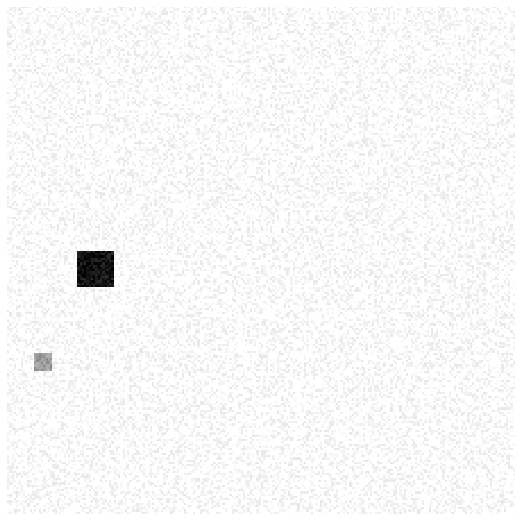

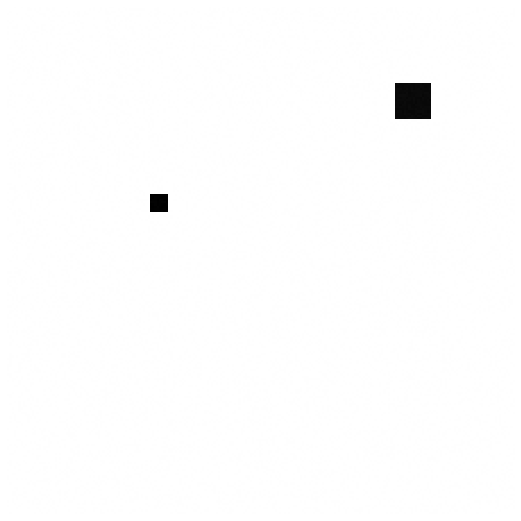

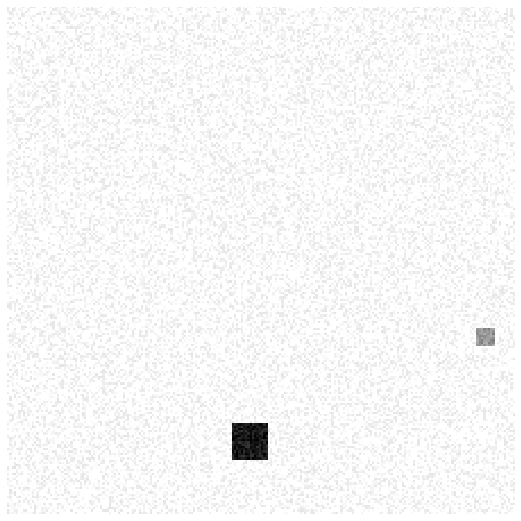

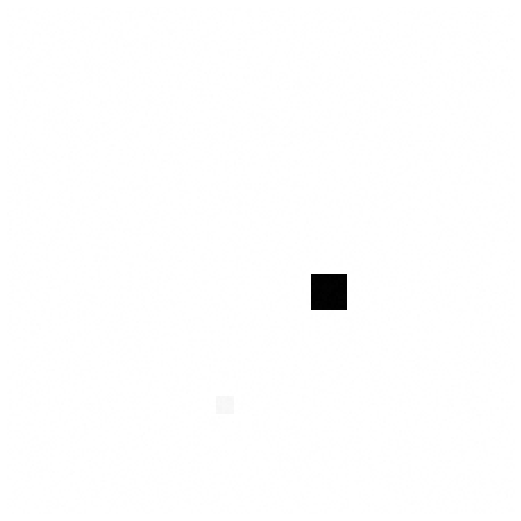

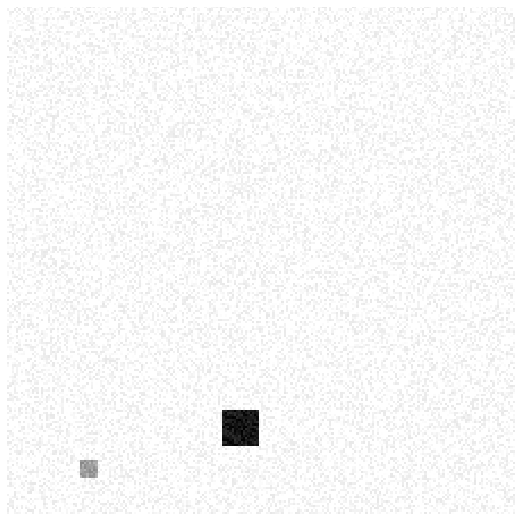

...

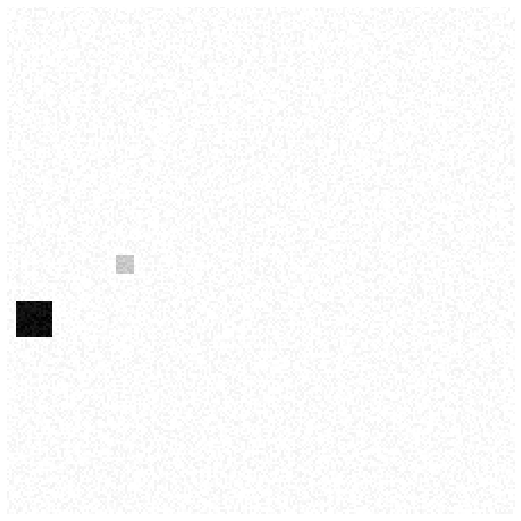

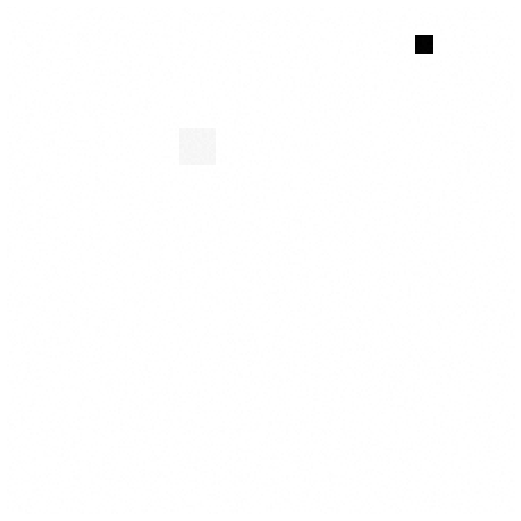

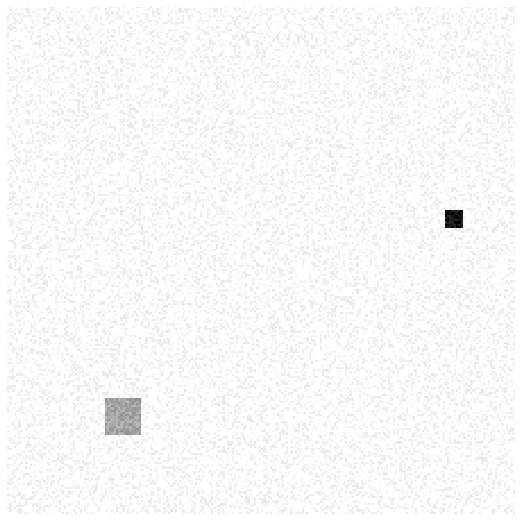

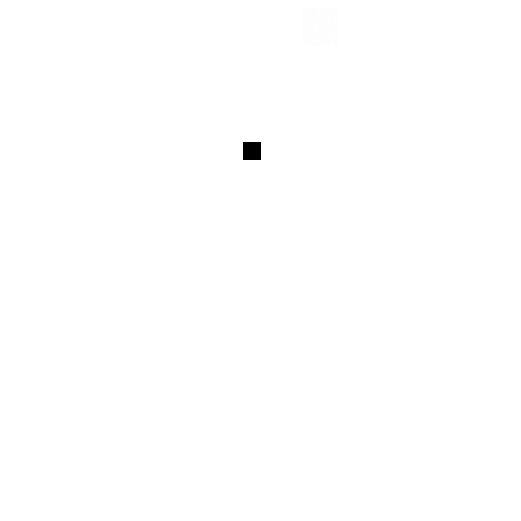

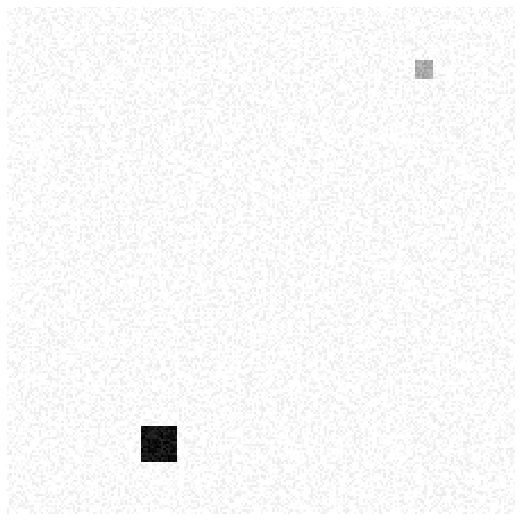

In [15]:

for i in range(300):
    plt.figure(figsize=(20,10))

    plt.subplot(122)
    plt.matshow(data[i], cmap = 'gray', fignum=False)
    plt.axis('off')

    plt.show()